### CP 3.0
- calculating statistics
- applying basic CPD methods
- example of clustering

In [37]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import itertools


# для создания графа
import networkx as nx

# для сохранения полученных файлов
import pickle

%config InlineBackend.figure_format = 'retina'

# для записи и сохранения файлов
import os
import pickle
from tqdm import tqdm

In [72]:
crypto_values = pd.read_csv("crypto_values.csv")
crypto_values['Date'] = pd.to_datetime(crypto_values['Date']).dt.date
crypto_values.head()

,Date,BTC-USD,ETH-USD,USDT-USD,BNB-USD,XRP-USD,DOGE-USD,ADA-USD,TRX-USD,BCH-USD,...,XEM-USD,ANT-USD,GAS-USD,TRAC-USD,TEL-USD,DCR-USD,WAVES-USD,ONT-USD,LSK-USD,PRO-USD
0,2018-05-16,8368.830078,707.049988,0.999950,12.2605,0.714081,0.004385,0.256375,0.071954,1280.619995,...,0.326662,4.25121,23.772699,0.305244,0.001933,92.537201,6.14829,7.33611,10.2751,1.29360
1,2018-05-17,8094.319824,672.656982,1.000190,12.4650,0.667310,0.004188,0.243664,0.067437,1206.170044,...,0.303940,4.00194,21.629299,0.267031,0.001863,93.603897,5.77118,6.78867,10.2056,1.25673
2,2018-05-18,8250.969727,694.367004,1.001110,15.1354,0.680294,0.004017,0.245544,0.069387,1207.239990,...,0.312504,3.99391,22.783800,0.282129,0.001889,104.896004,6.04157,6.93431,10.5002,1.25664
3,2018-05-19,8247.179688,696.530029,1.000360,14.2457,0.676713,0.004286,0.243271,0.069144,1184.959961,...,0.307566,3.95651,22.643000,0.275473,0.001962,107.647003,5.90110,7.22546,10.5730,1.22773
4,2018-05-20,8513.250000,715.369019,0.999117,14.1178,0.700244,0.004423,0.256136,0.077269,1291.770020,...,0.321398,3.93427,24.115700,0.257568,0.001955,111.217003,6.07135,7.93965,11.3074,1.32114


#### Class for calculating profitability and correlation within a 30-day window

In [34]:
class CryptoPreproc:
    def __init__(self, data):
        self.data = data

    def returns_calc(self):
        df = self.data
        df_returns = df.drop(columns=['Date']).pct_change()
        df_returns['Date'] = df.Date
        df_returns = df_returns.dropna().reset_index(drop=True)
        return df_returns


    def calculate_rolling_correlation(self, df, window='30D'):
        df['Date'] = pd.to_datetime(df['Date'])
        df.set_index('Date', inplace=True)
        df = df.dropna()

        rolling_correlation = df.rolling(window=window).corr()
        return rolling_correlation.reset_index()

    def visualize_rolling_correlation(self, rolling_correlation, ticker='BTC-USD', window='30D'):
        if 'level_1' in rolling_correlation.columns:
            tickers = rolling_correlation['level_1'].unique()
        else:
            print("The rolling correlation DataFrame does not have the expected structure.")
            return

        if ticker not in tickers:
            print(f"Ticker '{ticker}' not found in data.")
            return

        pairs = [(ticker, t) for t in tickers if t != ticker]
        pairs_to_plot = pairs[:10]

        plt.figure(figsize=(20, 3))
        for i, pair in enumerate(pairs_to_plot):
            crypto1, crypto2 = pair
            rolling_corr = rolling_correlation[rolling_correlation['level_1'] == crypto1]
            if crypto2 not in rolling_corr.columns:
                print(f"Ticker '{crypto2}' not found in correlation data.")
                continue
            plt.plot(rolling_corr['Date'], rolling_corr[crypto2], label=f'{crypto1}-{crypto2}')

        plt.title(f'Rolling Correlation ({window}) Between Cryptocurrencies')
        plt.xlabel('Date')
        plt.ylabel('Correlation')
        plt.xticks(rotation=45)
        plt.legend()
        plt.show()



In [75]:
#вычисления диаметра графа
def calculate_diameter(G):
    if nx.is_connected(G):  
        return nx.diameter(G)
    else:
        diameter = 0
        for subgraph in nx.connected_components(G):
            diameter = max(diameter, nx.diameter(G.subgraph(subgraph)))
        return diameter

# вычисления статистик графа
def calculate_graph_statistics(G):
    num_nodes = G.number_of_nodes()
    num_edges = G.number_of_edges()
    average_degree = np.mean([d for n, d in G.degree()])
    density = nx.density(G)
    diameter = calculate_diameter(G)
    clustering_coefficient = nx.average_clustering(G)
    return {
        "Number of nodes": num_nodes,
        "Number of edges": num_edges,
        "Average degree": average_degree,
        "Density": density,
        "Diameter": diameter,
        "Clustering coefficient": clustering_coefficient
    }

# построения графа на основе корреляционной матрицы и сохранения статистик
def build_and_save_graph(corr_matrix, date):
    threshold = 0.5
    G = nx.Graph()
    
    # Убедитесь, что первый столбец назван корректно, например, 'Crypto'
    corr_matrix.set_index(corr_matrix.columns[0], inplace=True)
    
    for crypto1 in corr_matrix.index:
        for crypto2 in corr_matrix.columns:
            if crypto1 != crypto2 and abs(corr_matrix.loc[crypto1, crypto2]) > threshold:
                G.add_edge(crypto1, crypto2, weight=corr_matrix.loc[crypto1, crypto2])

    if G.number_of_edges() == 0:
        print(f"Нет связей для порога {threshold} на {date}")
        return

    pos = nx.spring_layout(G)  # Положение узлов
    plt.figure(figsize=(10, 6))
    nx.draw(G, pos, with_labels=True, node_size=700, node_color='skyblue', font_size=10, font_weight='bold')
    edges = nx.get_edge_attributes(G, 'weight')
    nx.draw_networkx_edge_labels(G, pos, edge_labels=edges)
    plt.title(f"Correlation Graph for {date}")
    plt.savefig(f'graphs/graph_{date}.png')
    plt.close()

    
    graph_stats = calculate_graph_statistics(G)
    date_str = pd.to_datetime(date).strftime('%Y-%m-%d')
    
    # Сохранение статистик и структуры графа
    with open(f'graphs/graph_stats_{date_str}.pkl', 'wb') as f:
        pickle.dump({"statistics": graph_stats, "graph": G}, f)


preprocessor = CryptoPreproc(crypto_values)
returns = preprocessor.returns_calc()

# Вычисление скользящей корреляции
rolling_correlations = preprocessor.calculate_rolling_correlation(returns).dropna().reset_index(drop=True)


os.makedirs('graphs', exist_ok=True)


def create_daily_graphs(rolling_correlations):
    unique_dates = rolling_correlations['Date'].unique()
    for date in tqdm(unique_dates, desc="Processing dates"):
        daily_data = rolling_correlations[rolling_correlations['Date'] == date]
        if daily_data.empty:
            continue

        
        daily_corr_matrix = daily_data.drop(columns=['Date'])

        if daily_corr_matrix.empty or daily_corr_matrix.isnull().values.all():
            print(f"Корреляционная матрица для {date} пуста или содержит только NaN")
            continue

        build_and_save_graph(daily_corr_matrix, date)

# Построение графов для каждого дня и сохранение их статистик
create_daily_graphs(rolling_correlations)


Processing dates: 100%|██████████| 2188/2188 [31:36<00:00,  1.15it/s]  


**Let's see how the state of the graph changes by month: view of the graph on the first day of each month**

In [76]:
import matplotlib.pyplot as plt


def plot_graphs(graphs, cols=4):
    dates = sorted(graphs.keys())
    num_graphs = len(dates)
    rows = (num_graphs + cols - 1) // cols  # Вычисление количества рядов
    
    fig, axes = plt.subplots(rows, cols, figsize=(cols*5, rows*5))
    axes = axes.flatten()
    
    for i, date in enumerate(dates):
        G = graphs[date]
        pos = nx.spring_layout(G)
        ax = axes[i]
        nx.draw(G, pos, with_labels=True, ax=ax, node_size=700, node_color='skyblue', font_size=10, font_weight='bold')
        ax.set_title(f"Graph for {date}")
    
    
    for i in range(num_graphs, len(axes)):
        fig.delaxes(axes[i])
    
    plt.tight_layout()
    plt.show()

# Загрузка графов из файлов
def load_graphs_from_files(pkl_files):
    graphs = {}
    for file in pkl_files:
        date_str = file.split('_')[-1].replace('.pkl', '')
        date = pd.to_datetime(date_str).date()
        with open(os.path.join('graphs', file), 'rb') as f:
            data = pickle.load(f)
            graphs[date] = data["graph"]
    return graphs

# Чтение файлов статистик и добавление данных в словарь
pkl_files = [file for file in os.listdir('graphs') if file.endswith('.pkl')]
sorted_pkl_files = sorted(pkl_files)

# Фильтрация файлов по 1 числу каждого месяца
first_of_month_files = []
for file in sorted_pkl_files:
    date_str = file.split('_')[-1].replace('.pkl', '')
    date = pd.to_datetime(date_str)
    if date.day == 1:
        first_of_month_files.append(file)

# Загрузка графов из файлов
graphs = load_graphs_from_files(first_of_month_files)

# Вызов функции для визуализации графов
plot_graphs(graphs)


**Dynamics of Garf statistics**

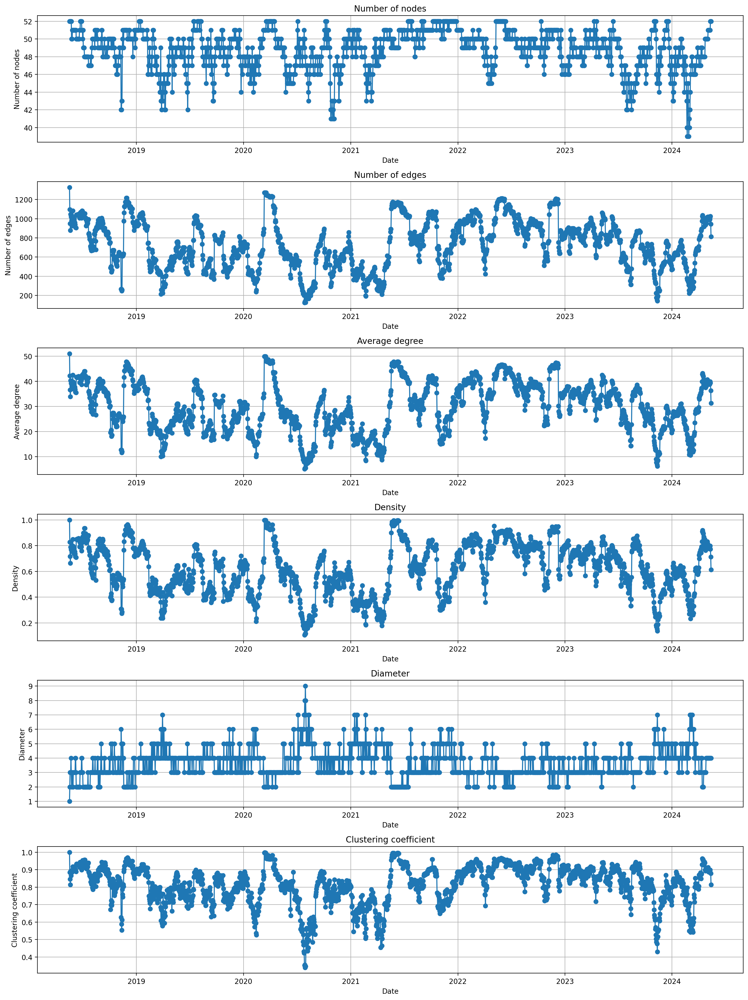

In [80]:
def plot_graph_statistics(stats_dir='graphs'):
    
    all_stats = {
        "Date": [],
        "Number of nodes": [],
        "Number of edges": [],
        "Average degree": [],
        "Density": [],
        "Diameter": [],
        "Clustering coefficient": []
    }
    
    
    pkl_files = [file for file in os.listdir(stats_dir) if file.endswith('.pkl')]
    sorted_pkl_files = sorted(pkl_files)
    
    for file in sorted_pkl_files:
        date_str = file.split('_')[-1].replace('.pkl', '')
        date = pd.to_datetime(date_str).date()
        
        with open(os.path.join(stats_dir, file), 'rb') as f:
            data = pickle.load(f)
        
        stats = data["statistics"]  # Извлечение подсловаря со статистиками
        
        all_stats["Date"].append(date)
        for key, value in stats.items():
            all_stats[key].append(value)
    
    
    stats_df = pd.DataFrame(all_stats)
    
    # Построение графиков изменения статистик
    fig, axes = plt.subplots(nrows=6, ncols=1, figsize=(15, 20))
    axes = axes.flatten()
    
    for i, (key, values) in enumerate(stats_df.drop(columns='Date').items()):
        axes[i].plot(stats_df['Date'], values, marker='o')
        axes[i].set_title(key)
        axes[i].set_xlabel('Date')
        axes[i].set_ylabel(key)
        axes[i].grid(True)
    
    plt.tight_layout()
    plt.show()


plot_graph_statistics('graphs')


**As we can see from the graphs, cyclicity is observed in the graph statistics.** \
**Since the number of coins is the same, and the trash hold is constant, there is no trend to change the main parameters of the graph.** \
**However, we see that almost all the statistics considered repeat each other’s shift.**

**One more metric has been added here - *Spectral gap* in the context of the Laplacian of a graph is the difference between the first and second smallest eigenvalues ​​of the Laplacian matrix.**

As you can see, each of the statistics shows its own CPD value, while it is noticeable that Largest Eigenvalue has more unstable behavior compared to other metrics

But in general, the methods work well and capture fluctuations in the series.\
The penalty has a great influence on the result, which in this version is calculated based on the dispersion of the series